## Introduction: Home Credit Default Risk Competition
https://www.kaggle.com/c/home-credit-default-risk

## 評価について

ROC



https://www.clg.niigata-u.ac.jp/~medimg/practice_medical_imaging/roc/1roc/index.htm

試験の点数から○○大学に合格（T）か不合格（F）かを予測したいときや，検査値から病気（T）か健康（F）かを判断したい。
要するに，与えられた値から，真（TRUE）か偽（FALSE）かを判断したいときに用いる指標。
受信者操作特性あるいは受信者動作特性などと訳される。
第２次世界大戦中に飛行機を発見するレーダー・システムの性能評価を目的として考案された方法である．飛来する物体が飛行機なのか鳥の群なのか，低空飛行をしている飛行機が認識できるかどうかといったレーダー・システムの能力を評価するために開発された．その後，人間の視知覚検出の性能を評価するために応用されるようになった。

## EDA

仮説：データに欠損値が多いとDefaultしやすいか

### Import a few packages

In [ ]:
!python --version 

In [ ]:
conda list

In [62]:
# numpy and pandas for data manipulation
import pandas as pd
import numpy as np

# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split
import time

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 500)
pd.set_option('display.max_rows', 1000)

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
import lightgbm as lgb

from sklearn.model_selection import KFold, cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn import metrics
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

from subprocess import check_output

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

import gc
gc.enable()

from tqdm import tqdm_notebook as tqdm

### ER

ER図：

https://www.kaggle.com/willkoehrsen/start-here-a-gentle-introduction

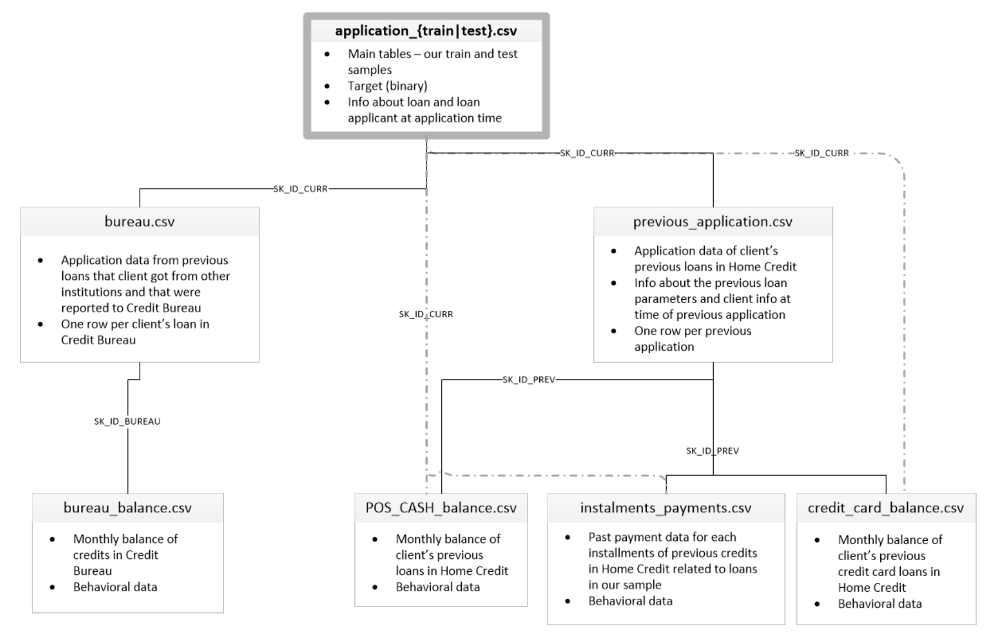

In [63]:
import os
import os.path
from IPython.display import display
from PIL import Image

path = "ER.png"
display(Image.open(path))

Introduction: Home Credit Default Risk Competition
This notebook is intended for those who are new to machine learning competitions or want a gentle introduction to the problem. I purposely avoid jumping into complicated models or joining together lots of data in order to show the basics of how to get started in machine learning! Any comments or suggestions are much appreciated.

In this notebook, we will take an initial look at the Home Credit default risk machine learning competition currently hosted on Kaggle. The objective of this competition is to use historical loan application data to predict whether or not an applicant will be able to repay a loan. This is a standard supervised classification task:

Supervised: The labels are included in the training data and the goal is to train a model to learn to predict the labels from the features
Classification: The label is a binary variable, 0 (will repay loan on time), 1 (will have difficulty repaying loan)
Data
The data is provided by Home Credit, a service dedicated to provided lines of credit (loans) to the unbanked population. Predicting whether or not a client will repay a loan or have difficulty is a critical business need, and Home Credit is hosting this competition on Kaggle to see what sort of models the machine learning community can develop to help them in this task.

There are 7 different sources of data:

application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application 
data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid.

bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.

bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.

previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.

POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.

credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.

installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

### Read application_train

In [64]:
#############################
# List files available
#############################

#print(os.listdir("../input/"))

In [65]:
train = pd.read_csv('input/application_train.csv')
train.shape

(307511, 122)

In [66]:
############################# 
# Check train data
############################# 

train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [67]:
#############################
# sample 307511
# memory usage: 286.2+ MB
#############################

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [68]:
train.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [69]:
############################# 
# Imbalance data
#############################

target_ratio = train.TARGET.value_counts()
target_ratio

0    282686
1     24825
Name: TARGET, dtype: int64

Text(0.5, 1.0, 'Ratio Defaulter')

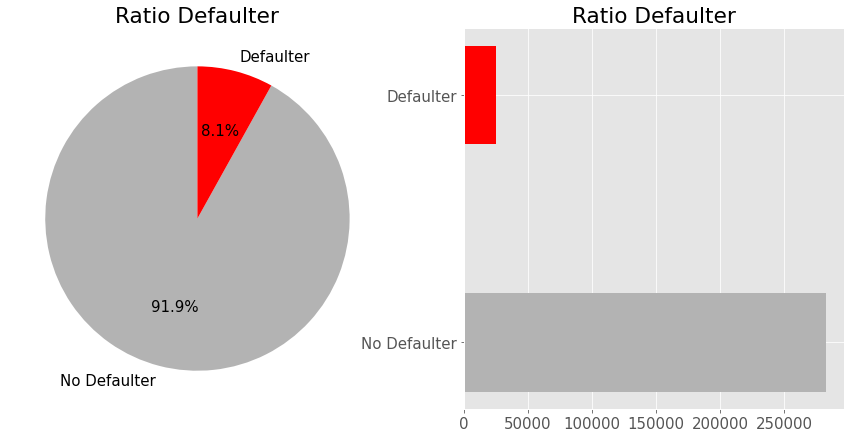

In [123]:
############################# 
# Proportion of Target 
#############################

plt.style.use('ggplot')
plt.rcParams.update({'font.size':15})

colors = ["0.7","red"]

label = ["No Defaulter", "Defaulter"]
plt.figure(figsize=(15, 7))
plt.subplot(1,2,1)
plt.pie(np.array(target_ratio), labels=label, 
        startangle=90, autopct="%1.1f%%",colors=colors) # labels:ラベル startangle:開始角度 autopct:割合表示
plt.title("Ratio Defaulter")

plt.subplot(1,2,2)
plt.barh(label, target_ratio, height=0.4,color=colors)
plt.title("Ratio Defaulter")

In [ ]:
df['TARGET'].value_counts().plot(kind='pie', startangle=90, autopct="%1.1f%%”)

In [71]:
############################# 
# Check the correlation of train data 
############################# 

train.corr()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000433,-0.000232,0.000849,-0.001500,0.001366,-0.000973,-0.000384,0.001818,0.002804,-0.001337,-0.000415,0.002815,0.002753,0.000281,-0.002895,-0.001075,-0.001138,0.000350,-0.000283,0.001097,0.002903,-0.001885,-0.001582,0.000067,0.000082,0.002342,0.000222,0.001556,-0.002070,0.001551,0.005900,-0.001463,0.004862,-0.002879,0.004851,0.003083,0.001465,0.003119,0.001770,-0.002575,0.003042,0.001961,-0.001411,0.001890,0.005245,-0.001058,0.005017,-0.002844,0.004386,0.002081,0.001548,0.003589,0.002156,-0.001923,0.001920,0.001988,-0.001647,0.001366,0.005777,-0.001036,0.005067,-0.002583,0.004588,0.002837,0.001699,0.003272,0.002205,-0.003020,0.002440,0.002288,-0.001409,-0.000082,-0.001423,0.001187,-0.000858,0.000700,-0.003411,-0.004139,-0.001097,0.002121,-0.002694,0.001809,0.001505,-0.000815,-0.002012,-0.001045,0.000896,-0.001077,0.002604,-0.000724,0.001450,0.000509,0.000167,0.001073,0.000282,-0.002672,-0.002193,0.002099,0.000485,0.001025,0.004659
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012817,-0.039645,-0.037227,0.078239,-0.044932,0.041975,0.051457,0.037612,0.000534,0.045982,0.028524,0.000370,-0.023806,-0.001758,0.009308,0.058899,0.060893,-0.024166,0.005576,0.006942,0.002819,0.044395,0.050994,0.032518,-0.155317,-0.160472,-0.178919,-0.029498,-0.022746,-0.009728,-0.022149,-0.018550,-0.034199,-0.019172,-0.044003,-0.033614,-0.010885,-0.025031,-0.032997,-0.003176,-0.013578,-0.027284,-0.019952,-0.009036,-0.022068,-0.016340,-0.032131,-0.017387,-0.043226,-0.032698,-0.010174,-0.023393,-0.030685,-0.001557,-0.012711,-0.029184,-0.022081,-0.009993,-0.022326,-0.018573,-0.033863,-0.019025,-0.043768,-0.033394,-0.011256,-0.024621,-0.032739,-0.002757,-0.013337,-0.032596,0.009131,0.032248,0.009022,0.031276,0.055218,0.005417,0.044346,-0.002672,-0.000316,-0.028602,-0.001520,-0.008040,-0.004352,-0.001414,-0.004229,-0.000756,-0.011583,-0.009464,-0.006536,-0.011615,-0.003378,-0.007952,-0.001358,0.000215,0.003709,0.000930,0.002704,0.000788,-0.012462,-0.002022,0.019930
CNT_CHILDREN,-0.001129,0.019187,1.0000

In [72]:
############################# 
# Top 10 list of the absolute values of correlation coefficient
#############################

cor = train.corr()['TARGET'].abs().nlargest(10)
cor

TARGET                         1.000000
EXT_SOURCE_3                   0.178919
EXT_SOURCE_2                   0.160472
EXT_SOURCE_1                   0.155317
DAYS_BIRTH                     0.078239
REGION_RATING_CLIENT_W_CITY    0.060893
REGION_RATING_CLIENT           0.058899
DAYS_LAST_PHONE_CHANGE         0.055218
DAYS_ID_PUBLISH                0.051457
REG_CITY_NOT_WORK_CITY         0.050994
Name: TARGET, dtype: float64

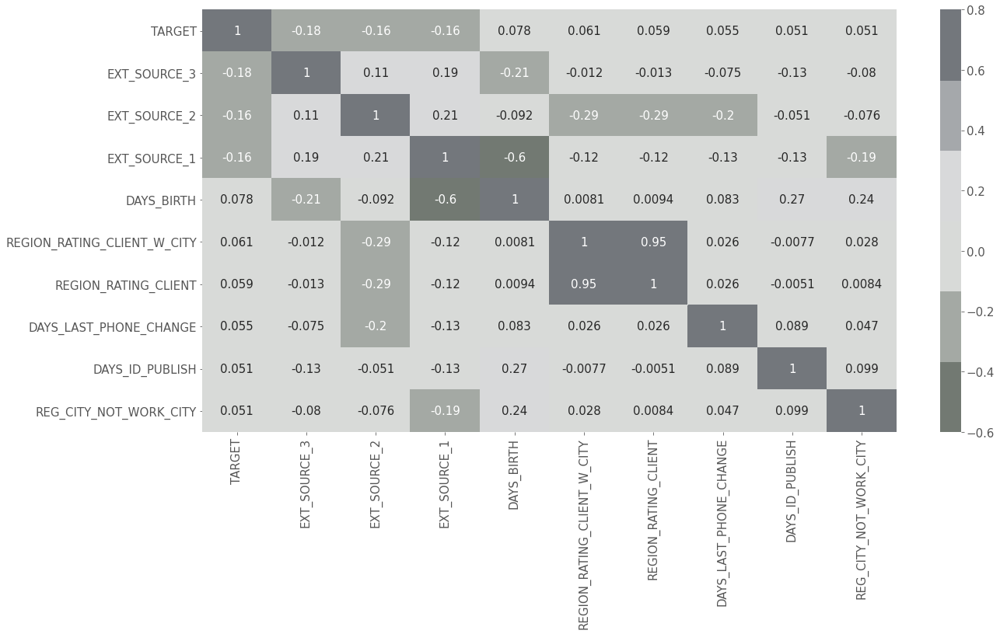

In [73]:
############################# 
# Visualize correlation with heatmap
#############################

top_features = cor.index

plt.figure(figsize=(20,10))

pal = sns.diverging_palette(128, 240, 8)

sns.heatmap(train[cor.index].corr(), vmax=0.8, annot=True, cmap=pal)
plt.show()

In [136]:
'''

データ尺度の違いによる相関関係を数値化する方法の種類
https://toukeigaku-jouhou.info/2018/09/13/kind-of-correlation/

相関比の計算式
https://kame-els.eng.socu.ac.jp/2019/mod/book/view.php?id=3&chapterid=360

Pythonで相関比を計算する
https://stackoverflow.com/questions/52083501/how-to-compute-correlation-ratio-or-eta-in-python

'''
# 相関比

def correlation_ratio(categories, measurements):
        fcat, _ = pd.factorize(categories)
        cat_num = np.max(fcat)+1
        y_avg_array = np.zeros(cat_num)
        n_array = np.zeros(cat_num)
        for i in range(0,cat_num):
            cat_measures = measurements[np.argwhere(fcat == i).flatten()]
            n_array[i] = len(cat_measures)
            y_avg_array[i] = np.average(cat_measures)
        y_total_avg = np.sum(np.multiply(y_avg_array,n_array))/np.sum(n_array)
        numerator = np.sum(np.multiply(n_array,np.power(np.subtract(y_avg_array,y_total_avg),2)))
        denominator = np.sum(np.power(np.subtract(measurements,y_total_avg),2))
        if numerator == 0:
            eta = 0.0
        else:
            eta = numerator/denominator
        return eta

In [139]:
correlation_ratio(train['TARGET'], train['DAYS_BIRTH'])

0.006121389364800157

In [140]:
correlation_ratio(train['TARGET'], train['EXT_SOURCE_3'])

nan

In [142]:
correlation_ratio(train['TARGET'], train['REGION_RATING_CLIENT_W_CITY'])

0.0037079169631601093

In [133]:
############################# 
# Top 10 list of the absolute values of correlation coefficient
#############################


cor_sp = train.corr(method='spearman')['TARGET'].abs().nlargest(10)
cor_sp

TARGET                         1.000000
EXT_SOURCE_3                   0.166330
EXT_SOURCE_1                   0.151128
EXT_SOURCE_2                   0.147332
DAYS_BIRTH                     0.078328
REGION_RATING_CLIENT_W_CITY    0.060936
REGION_RATING_CLIENT           0.058909
DAYS_LAST_PHONE_CHANGE         0.053711
OWN_CAR_AGE                    0.052932
DAYS_ID_PUBLISH                0.052535
Name: TARGET, dtype: float64

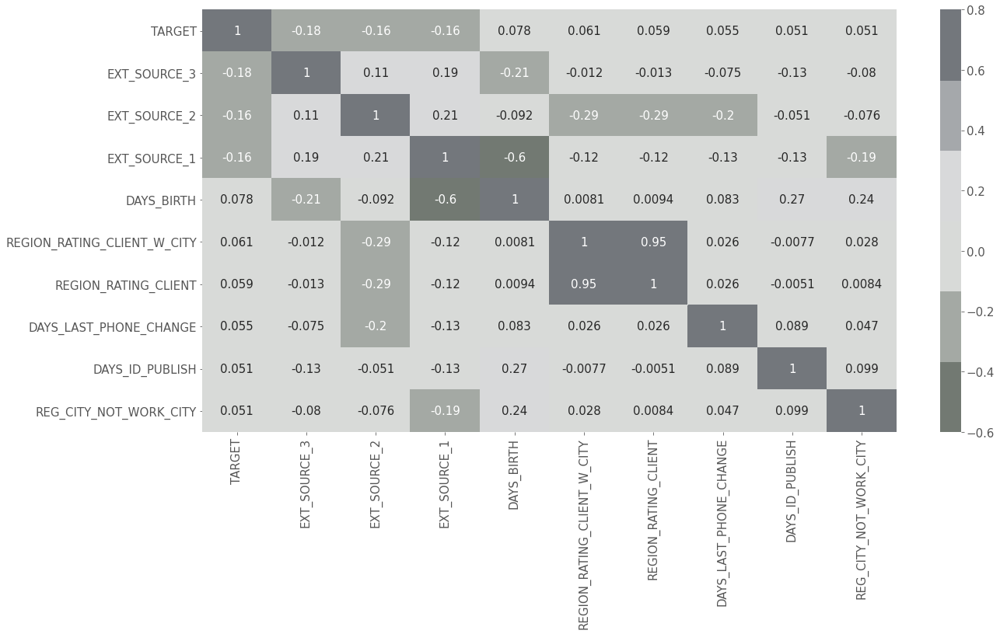

In [135]:
############################# 
# Visualize correlation with heatmap
#############################

top_features = cor_sp.index

plt.figure(figsize=(20,10))

pal = sns.diverging_palette(128, 240, 8)

sns.heatmap(train[cor.index].corr(), vmax=0.8, annot=True, cmap=pal)
plt.show()

snsのカラーパレット：

http://jose-coto.com/styling-with-seaborn

### Read application_test

In [74]:
############################# 
# Read application_test
#############################

test = pd.read_csv('input/application_test.csv')
test.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.125,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married

In [75]:
############################# 
# Read sample_submission
#############################

submission = pd.read_csv('input/sample_submission.csv')
submission.shape, test.shape    # submission & test shape

((48744, 2), (48744, 121))

In [76]:
############################# 
# Check test data
#############################

test.info()
test.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48744 entries, 0 to 48743
Columns: 121 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(40), object(16)
memory usage: 45.0+ MB


,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,48744.000000,48744.000000,4.874400e+04,4.874400e+04,48720.000000,4.874400e+04,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,16432.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,28212.000000,48736.000000,40076.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,24857.000000,21103.000000,25888.000000,16926.000000,15249.000000,23555.000000,25165.000000,25423.000000,16278.000000,20490.000000,15964.000000,25192.000000,15397.000000,22660.000000,26120.000000,48715.000000,48715.000000,48715.000000,48715.000000,48744.000000,48744.0,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.000000,48744.0,48744.000000,48744.0,48744.0,48744.0,48744.0,48744.0,48744.0,48744.000000,48744.0,48744.0,48744.0,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000,42695.000000
mean,277796.676350,0.397054,1.784318e+05,5.167404e+05,29426.240209,4.626188e+05,0.021226,-16068.084605,67485.366322,-4967.652716,-3051.712949,11.786027,0.999979,0.809720,0.204702,0.998400,0.263130,0.162646,2.146767,2.038159,2.012596,12.007365,0.018833,0.055166,0.042036,0.077466,0.224664,0.174216,0.501180,0.518021,0.500106,0.122388,0.090065,0.978828,0.751137,0.047624,0.085168,0.151777,0.233706,0.238423,0.067192,0.105885,0.112286,0.009231,0.029387,0.119078,0.088998,0.978292,0.758327,0.045223,0.080570,0.147161,0.229390,0.233854,0.065914,0.110874,0.110687,0.008358,0.028161,0.122809,0.089529,0.978822,0.754344,0.047420,0.084128,0.151200,0.233154,0.237846,0.068069,0.107063,0.113368,0.008979,0.029296,0.107129,1.447644,0.143652,1.435738,0.101139,-1077.766228,0.0,0.786620,

### concatenate train_test

In [77]:
############################## 
# concatenate train_test 
############################## 

traintest = train.append(test)

# check shape
print(traintest.shape, train.shape, test.shape, submission.shape)

(356255, 122) (307511, 122) (48744, 121) (48744, 2)


### Imputation of Categorical Variables

https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4


＜Imputation of Categorical Variables＞

1. Mode imputation is one method but it will definitely introduce bias

2. Missing values can be treated as a separate category by itself. We can create another category for the missing values and use them as a different level. This is the simplest method.

3. Prediction models: Here, we create a predictive model to estimate values that will substitute the missing data. In this case, we divide our data set into two sets: One set with no missing values for the variable (training) and another one with missing values (test). We can use methods like logistic regression and ANOVA for prediction

4. Multiple Imputation


ここでは、カテゴリカルな値の欠損値それ自体を、独立したカテゴリーとして扱うシンプルな手法（2番目）を採用する。pd.factorize()を用いると、Objectカラムの欠損値は-1のカテゴリーとして補填される。

最頻値で補填するとbias（過学習状態）を招くらしい（1番目）。

In [78]:
############################## 
# objectカラムの値を数値変換
# 欠損値は-1のカテゴリーとして分ける
############################## 

categorical_feats = [
    f for f in traintest.columns if traintest[f].dtype == 'object'
]
categorical_feats_ = categorical_feats.copy()# 43

for f in categorical_feats_:
    traintest[f], _ = pd.factorize(traintest[f])
    traintest[f] = traintest[f].astype('int')

In [79]:
##############################
# データ型確認 --> int型とfloat型のみ
##############################

traintest.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 356255 entries, 0 to 48743
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(66), int64(56)
memory usage: 334.3 MB


### Check Missing Values 

欠損データには以下のタイプがある

- Missing at Random (MAR): 

    Missing at random means that the propensity for a data point to be missing is not related to the missing data, but it is related to some of the observed data


- Missing Completely at Random (MCAR): 

    The fact that a certain value is missing has nothing to do with its hypothetical value and with the values of other variables.


- Missing not at Random (MNAR): 

    Two possible reasons are that the missing value depends on the hypothetical value (e.g. People with high salaries generally do not want to reveal their incomes in surveys) or missing value is dependent on some other variable’s value (e.g. Let’s assume that females generally don’t want to reveal their ages! Here the missing value in age variable is impacted by gender variable)

-------------------------------------------

- MAR

    ランダムな欠損：データ点（サンプル）のもつ特徴は、実測データとは関係するが、欠損データには関係しない。


- MCAR

    特定の値の欠損：それについて予想される値や、あるいは、他の特徴量の値となんら関係がない。＊調査側の都合による欠損もここに入る？


- MNAR

    ランダムでない欠損：2つの理由が考えられる。
      予想される値と関係がある（例えば、高所得の人は調査で収入を明かしたくない）
      他の特徴量の値と関係がある（例えば、女性は一般的に年齢を明かしたくない。つまり'age 　
      variable'は'gender variable'による影響を受けている）

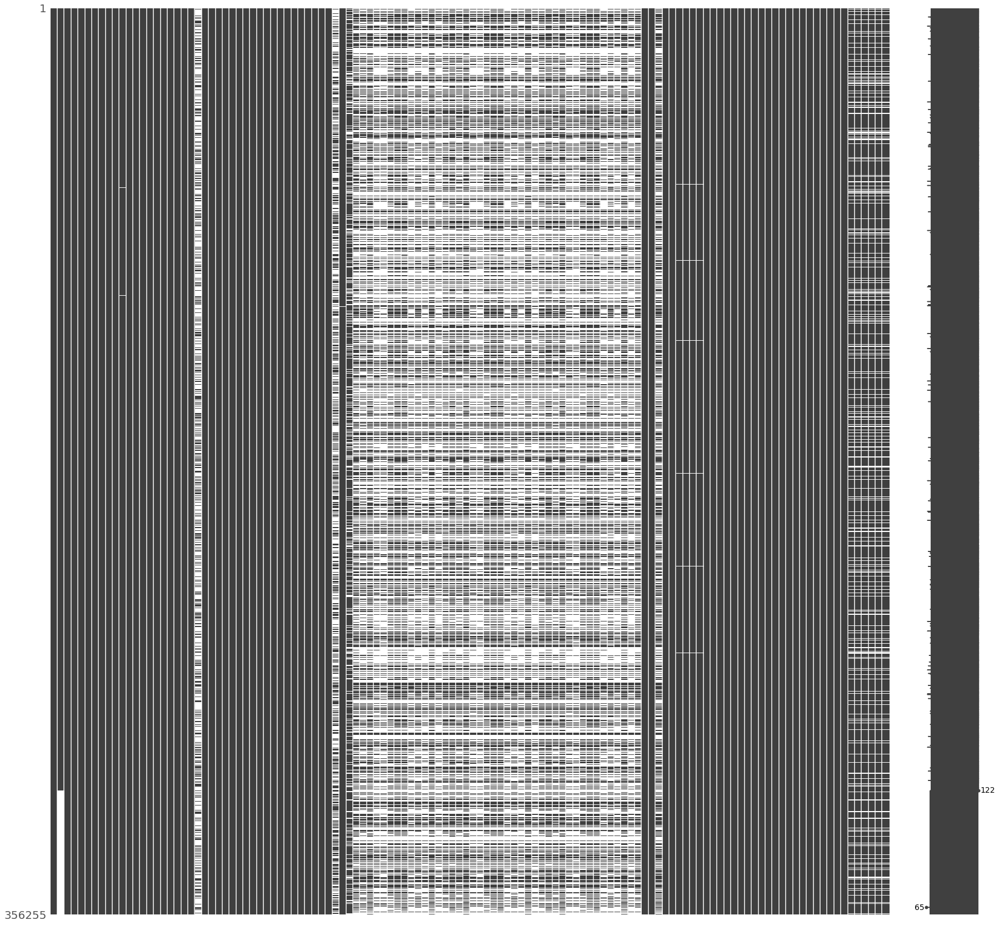

In [80]:
############################## 
# 残りのint型とfloat型の欠損値のばらつきを確認
##############################

# !pip install missingno=='0.4.1' # 0.4.0はmsno.barでエラーが出る
import missingno as msno

# Nullity or missing values by columns

msno.matrix(traintest, figsize=(30, 30))
plt.show()

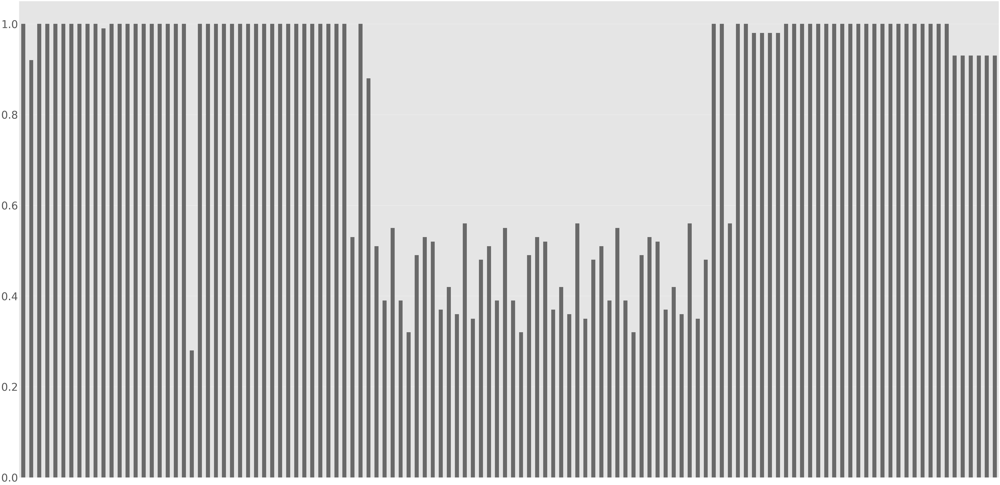

In [81]:
############################## 
# 欠損値の割合を確認
##############################

msno.bar(traintest.sample(100), figsize=(100, 50), fontsize=60)
plt.show()

連続値はユークリッド距離でクラスタリングをするのがよい

https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4

The distance metric varies according to the type of data:
1. Continuous Data: The commonly used distance metrics for continuous data are Euclidean, Manhattan and Cosine

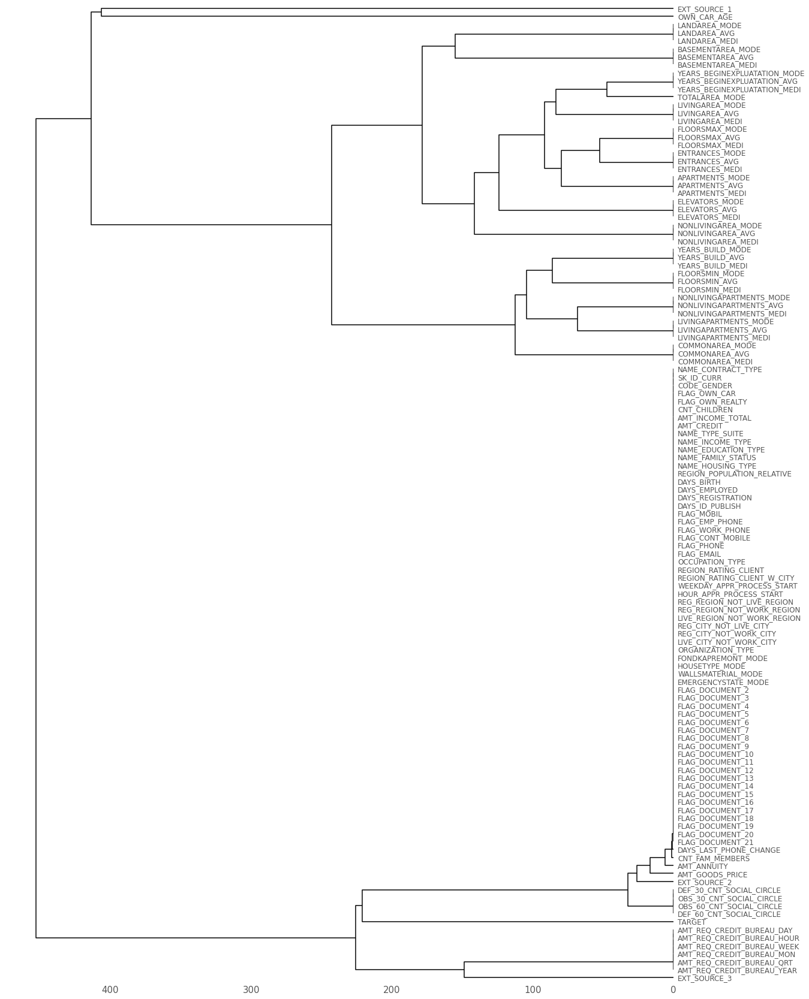

In [82]:
############################## 
# Check Euclidean distance
##############################

msno.dendrogram(traintest, inline=True, fontsize=12, figsize=(20,30))

欠損値に関するkernel：

https://www.kaggle.com/jpmiller/patterns-of-missing-data


In [83]:
############################## 
# Missing columns： 62
############################## 

mis_count = traintest.isnull().sum()
# len(traintest) - traintest.count()
# https://code.i-harness.com/ja-jp/q/190cafa 参照

print('numbers of columnns including Missing Values: {} '
      .format(mis_count[mis_count > 0].count()))

# print(mis_count[mis_count > 0].index)

numbers of columnns including Missing Values: 62 


In [84]:
##############################
# 欠損値の総数（降順）---- sample数 356255個中 ---- 
##############################

mis_count[mis_count!=0].sort_values(ascending=False)

COMMONAREA_MODE                 248360
COMMONAREA_MEDI                 248360
COMMONAREA_AVG                  248360
NONLIVINGAPARTMENTS_MEDI        246861
NONLIVINGAPARTMENTS_AVG         246861
NONLIVINGAPARTMENTS_MODE        246861
LIVINGAPARTMENTS_AVG            242979
LIVINGAPARTMENTS_MODE           242979
LIVINGAPARTMENTS_MEDI           242979
FLOORSMIN_MODE                  241108
FLOORSMIN_MEDI                  241108
FLOORSMIN_AVG                   241108
YEARS_BUILD_MODE                236306
YEARS_BUILD_AVG                 236306
YEARS_BUILD_MEDI                236306
OWN_CAR_AGE                     235241
LANDAREA_AVG                    210844
LANDAREA_MEDI                   210844
LANDAREA_MODE                   210844
BASEMENTAREA_MEDI               207584
BASEMENTAREA_AVG                207584
BASEMENTAREA_MODE               207584
NONLIVINGAREA_MEDI              195766
NONLIVINGAREA_MODE              195766
NONLIVINGAREA_AVG               195766
EXT_SOURCE_1             

In [85]:
############################## 
# 欠損値の割合（降順）
############################## 

mis_val_percent = 100 * mis_count / len(traintest)
print(mis_val_percent[mis_val_percent > 0].sort_values(ascending=False))

COMMONAREA_MODE                 69.714109
COMMONAREA_MEDI                 69.714109
COMMONAREA_AVG                  69.714109
NONLIVINGAPARTMENTS_MEDI        69.293343
NONLIVINGAPARTMENTS_AVG         69.293343
NONLIVINGAPARTMENTS_MODE        69.293343
LIVINGAPARTMENTS_AVG            68.203674
LIVINGAPARTMENTS_MODE           68.203674
LIVINGAPARTMENTS_MEDI           68.203674
FLOORSMIN_MODE                  67.678489
FLOORSMIN_MEDI                  67.678489
FLOORSMIN_AVG                   67.678489
YEARS_BUILD_MODE                66.330578
YEARS_BUILD_AVG                 66.330578
YEARS_BUILD_MEDI                66.330578
OWN_CAR_AGE                     66.031635
LANDAREA_AVG                    59.183450
LANDAREA_MEDI                   59.183450
LANDAREA_MODE                   59.183450
BASEMENTAREA_MEDI               58.268375
BASEMENTAREA_AVG                58.268375
BASEMENTAREA_MODE               58.268375
NONLIVINGAREA_MEDI              54.951088
NONLIVINGAREA_MODE              54

```
TARGET との相関係数値と欠損値の割合

                                 相関係数値  欠損値の割合
- EXT_SOURCE_3                   0.178919  19.545831
- EXT_SOURCE_2                   0.160472  0.187506
- EXT_SOURCE_1                   0.155317  54.430113
- DAYS_BIRTH                     0.078239  0
- REGION_RATING_CLIENT_W_CITY    0.060893  0
- REGION_RATING_CLIENT           0.058899  0
- DAYS_LAST_PHONE_CHANGE         0.055218  0.000281
- DAYS_ID_PUBLISH                0.051457  0
- REG_CITY_NOT_WORK_CITY         0.050994  0
```

In [86]:
missing_index = traintest.AMT_ANNUITY.isnull()
existing_index = traintest.AMT_ANNUITY.notnull()

missing_data = traintest.copy()
test_AMT_ANNUITY =  missing_data.AMT_ANNUITY[missing_index]
test_AMT_ANNUITY

47531    NaN
50035    NaN
51594    NaN
55025    NaN
59934    NaN
75873    NaN
89343    NaN
123872   NaN
207186   NaN
227939   NaN
239329   NaN
241835   NaN
896      NaN
1145     NaN
2277     NaN
4141     NaN
6791     NaN
6985     NaN
7307     NaN
8207     NaN
9246     NaN
9830     NaN
10779    NaN
10861    NaN
11591    NaN
13387    NaN
13564    NaN
13738    NaN
14008    NaN
22146    NaN
22663    NaN
26027    NaN
26046    NaN
33294    NaN
43434    NaN
44210    NaN
Name: AMT_ANNUITY, dtype: float64

In [87]:
train_AMT_ANNUITY =  missing_data.AMT_ANNUITY[existing_index]
train_AMT_ANNUITY

0        24700.5
1        35698.5
2         6750.0
3        29686.5
4        21865.5
          ...   
48739    17473.5
48740    31909.5
48741    33205.5
48742    25128.0
48743    24709.5
Name: AMT_ANNUITY, Length: 356219, dtype: float64

In [88]:
missing_data[missing_index] = 0
missing_data[existing_index] = 1

missing_data.corr()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
TARGET,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
NAME_CONTRACT_TYPE,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
CODE_GENDER,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1

In [89]:
############################# 
# Top 10 list of the absolute values of correlation coefficient
#############################

missing_cor = missing_data.corr()['TARGET'].abs().nlargest(10)
missing_cor

SK_ID_CURR            1.0
TARGET                1.0
NAME_CONTRACT_TYPE    1.0
CODE_GENDER           1.0
FLAG_OWN_CAR          1.0
FLAG_OWN_REALTY       1.0
CNT_CHILDREN          1.0
AMT_INCOME_TOTAL      1.0
AMT_CREDIT            1.0
AMT_ANNUITY           1.0
Name: TARGET, dtype: float64

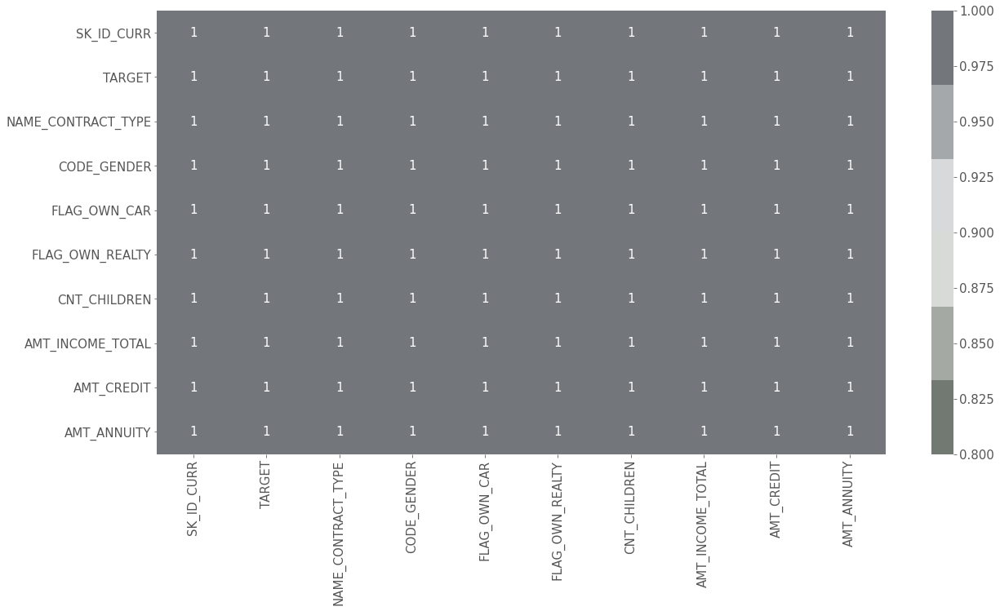

In [90]:
############################# 
# Visualize correlation with heatmap
#############################

missing_top_features = missing_cor.index

plt.figure(figsize=(20,10))

pal = sns.diverging_palette(128, 240, 8)

sns.heatmap(missing_data[missing_cor.index].corr(), vmax=0.8, annot=True, cmap=pal)
plt.show()

Targetと相関の高いものにも欠損値が多く含まれる --> 欠損値が多いカラムも残したい

In [91]:
############################## 
# Missing columns
##############################

mis_columns = mis_count[mis_count > 0].index
traintest[mis_columns].head(10)

,TARGET,AMT_ANNUITY,AMT_GOODS_PRICE,OWN_CAR_AGE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,1.0,24700.5,351000.0,NaN,1.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,0.0149,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,0.0,35698.5,1129500.0,NaN,2.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,0.0714,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,6750.0,135000.0,26.0,1.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,29686.5,297000.0,NaN,2.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0,21865.5,513000.0,NaN,1.0,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,27517.5,454500.0,NaN,2.0,NaN,0.354225,0.621226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-2536.0,0.0,0.0,0.0,0.0,1.0,1.0
6,0.0,41301.0,1395000.0,17.0,3.0,0.774761,0.724000,0.492060,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,-1562.0,0.0,0.0,0.0,1.0,1.0,2.0
7,0.0,42075.0,1530000.0,8.0,2.0,NaN,0.714279,0.540654,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-1070.0,0.0,0.0,0.0,0.0,0.0,0.0
8,0.0,33826.5,913500.0,NaN,2.0,0.587334,0.205747,0.751724,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9,0.0,20250.0,405000.0,NaN,1.0,NaN,0.746644,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [92]:
############################## 
# Missing columnsのユニーク値の数
##############################

# カラムを欠損値数降順にする
mis_columns_sort = mis_count[mis_count!=0].sort_values(ascending=False).index

for col in mis_columns_sort:
    
    print('{a} : {b}'.format(a = col, b = traintest[col].nunique()))

COMMONAREA_MODE : 3215
COMMONAREA_MEDI : 3289
COMMONAREA_AVG : 3271
NONLIVINGAPARTMENTS_MEDI : 231
NONLIVINGAPARTMENTS_AVG : 410
NONLIVINGAPARTMENTS_MODE : 178
LIVINGAPARTMENTS_AVG : 1917
LIVINGAPARTMENTS_MODE : 749
LIVINGAPARTMENTS_MEDI : 1119
FLOORSMIN_MODE : 25
FLOORSMIN_MEDI : 47
FLOORSMIN_AVG : 318
YEARS_BUILD_MODE : 154
YEARS_BUILD_AVG : 149
YEARS_BUILD_MEDI : 151
OWN_CAR_AGE : 63
LANDAREA_AVG : 3580
LANDAREA_MEDI : 3618
LANDAREA_MODE : 3621
BASEMENTAREA_MEDI : 3821
BASEMENTAREA_AVG : 3831
BASEMENTAREA_MODE : 3891
NONLIVINGAREA_MEDI : 3419
NONLIVINGAREA_MODE : 3432
NONLIVINGAREA_AVG : 3397
EXT_SOURCE_1 : 134315
ELEVATORS_MEDI : 46
ELEVATORS_AVG : 266
ELEVATORS_MODE : 26
APARTMENTS_MODE : 770
APARTMENTS_AVG : 2391
APARTMENTS_MEDI : 1163
ENTRANCES_AVG : 294
ENTRANCES_MODE : 30
ENTRANCES_MEDI : 46
LIVINGAREA_MODE : 5382
LIVINGAREA_AVG : 5272
LIVINGAREA_MEDI : 5360
FLOORSMAX_MODE : 25
FLOORSMAX_AVG : 414
FLOORSMAX_MEDI : 49
YEARS_BEGINEXPLUATATION_MODE : 224
YEARS_BEGINEXPLUATATION_A

TARGETと相関の高い EXT_SOURCE_1、EXT_SOURCE_2、EXT_SOURCE_3と、欠損値の多いCOMMONAREA_MODEにおける分布を見てみる（欠損値と欠損値でない値に色分けする）。

これによって、他の特徴量が影響していないか（MNAR）どうかを確認する。

In [93]:
############################## 
# EXT_SOURCE_1（外部ソース1）の欠損値をプロットする
##############################

indexer_1 = traintest['EXT_SOURCE_1'].isnull()
missing_1 = traintest['EXT_SOURCE_1'].copy()
missing_1[indexer_1] = -1
missing_1[~indexer_1] = 1
df_missing_1 = pd.DataFrame(missing_1)
df_missing_1.columns = ['MISSING']

In [94]:
df_EXT_SOURCE_1 = traintest['EXT_SOURCE_1'].copy()
df_EXT_SOURCE_1[indexer_1] = 0.501180 # プロットのために平均値で欠損値を埋める
df_EXT_SOURCE_1 = pd.DataFrame(df_EXT_SOURCE_1)
df_EXT_SOURCE_1.columns = ['EXT_SOURCE_1_MEANS']

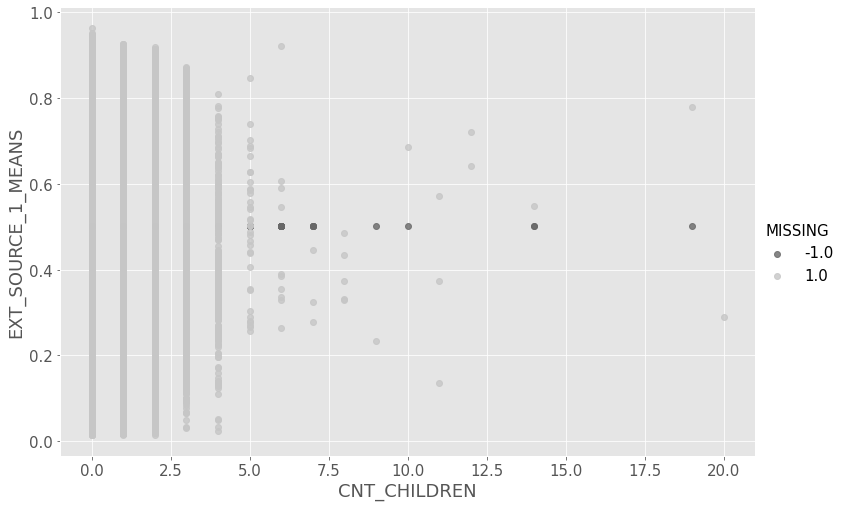

In [95]:
df_EXT_SOURCE_1_missing = pd.concat([df_missing_1, df_EXT_SOURCE_1, traintest], axis = 1)

ax = sns.lmplot(x='CNT_CHILDREN', y='EXT_SOURCE_1_MEANS',fit_reg = False,
                data=df_EXT_SOURCE_1_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

# sns.lmplot :palette option
# https://kminito.github.io/study_notes/visualization

'EXT_SOURCE_1'（外部ソース1）と'CNT_CHILDREN'（子供の数）だとMAR？

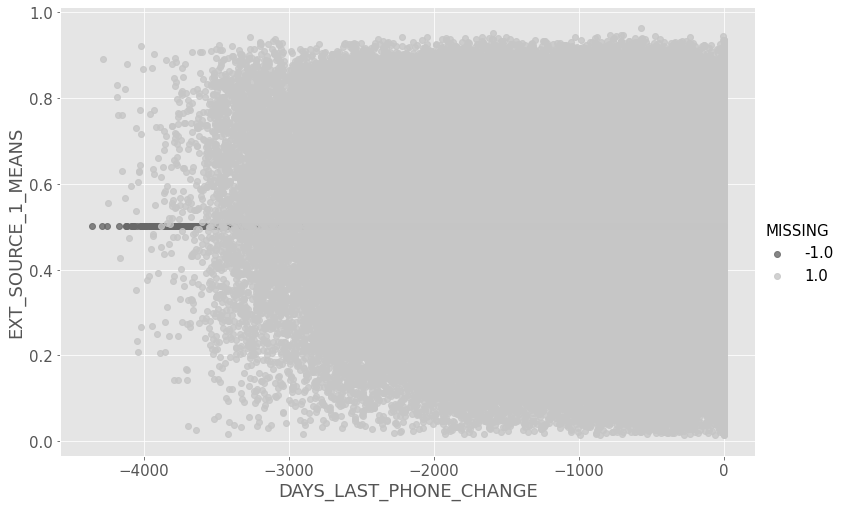

In [96]:
ax = sns.lmplot(x='DAYS_LAST_PHONE_CHANGE', y='EXT_SOURCE_1_MEANS',fit_reg = False,
                data=df_EXT_SOURCE_1_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

'EXT_SOURCE_1'（外部ソース1）と'DAYS_LAST_PHONE_CHANGE'（最後に電話番号を変えてからの日数）もMAR

In [97]:
############################## 
# EXT_SOURCE_2（外部ソース2）の欠損値をプロットする
##############################

indexer_2 = traintest['EXT_SOURCE_2'].isnull()
missing_2 = traintest['EXT_SOURCE_2'].copy()
missing_2[indexer_2] = -1
missing_2[~indexer_2] = 1
df_missing_2 = pd.DataFrame(missing_2)
df_missing_2.columns = ['MISSING'] # 欠損値とそうでない値のindex

In [98]:
df_EXT_SOURCE_2 = traintest['EXT_SOURCE_2'].copy()
df_EXT_SOURCE_2[indexer_2] = 5.143927e-01 # プロットのために平均値で欠損値を埋める
df_EXT_SOURCE_2 = pd.DataFrame(df_EXT_SOURCE_2)
df_EXT_SOURCE_2.columns = ['EXT_SOURCE_2_MEANS']

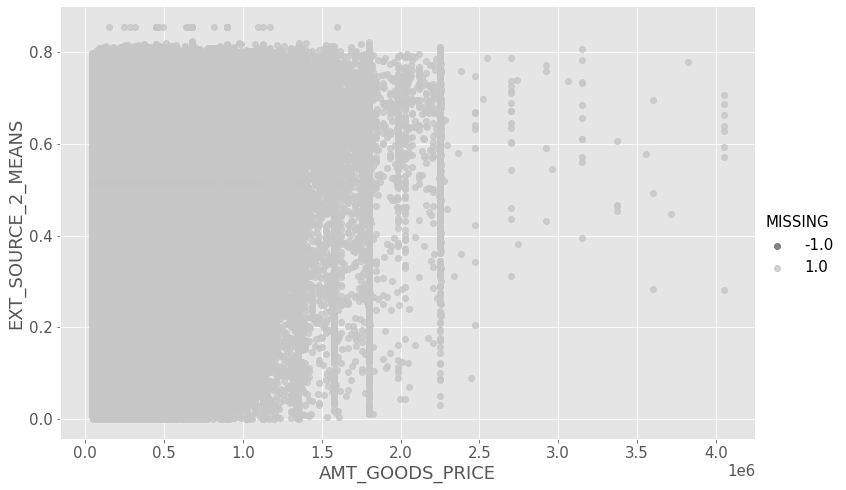

In [99]:
df_EXT_SOURCE_2_missing = pd.concat([df_missing_2, df_EXT_SOURCE_2, traintest], axis = 1)

ax = sns.lmplot(x='AMT_GOODS_PRICE', y='EXT_SOURCE_2_MEANS',fit_reg = False,
                data=df_EXT_SOURCE_2_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

'EXT_SOURCE_2'は欠損値が少ないので欠損値のプロットが見つけられない?

In [100]:
############################## 
# EXT_SOURCE_3（外部ソース3）の欠損値をプロットする
##############################

indexer_3 = traintest['EXT_SOURCE_3'].isnull()
missing_3 = traintest['EXT_SOURCE_3'].copy()
missing_3[indexer_3] = -1
missing_3[~indexer_3] = 1
df_missing_3 = pd.DataFrame(missing_3)
df_missing_3.columns = ['MISSING'] # 欠損値とそうでない値のindex

In [101]:
df_EXT_SOURCE_3 = traintest['EXT_SOURCE_3'].copy()
df_EXT_SOURCE_3[indexer_3] = 0.500106 # プロットのために平均値で欠損値を埋める
df_EXT_SOURCE_3 = pd.DataFrame(df_EXT_SOURCE_3)
df_EXT_SOURCE_3.columns = ['EXT_SOURCE_3_MEANS']

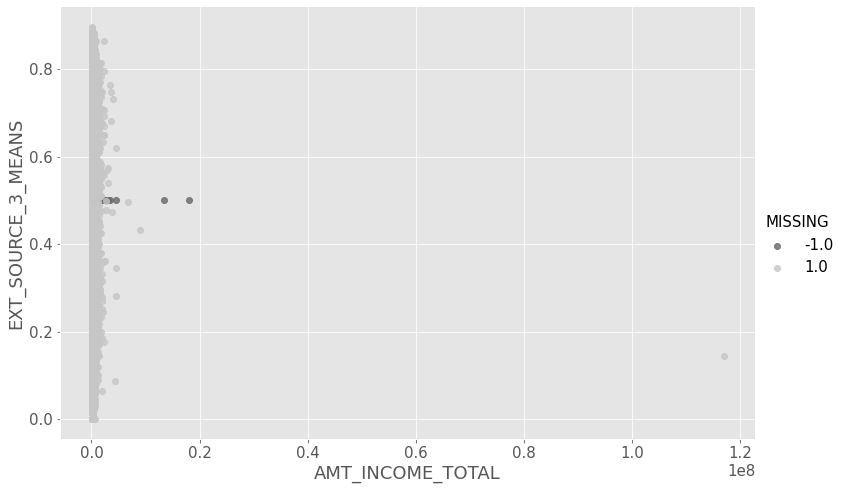

In [102]:
df_EXT_SOURCE_3_missing = pd.concat([df_missing_3, df_EXT_SOURCE_3, traintest], 
                                    axis = 1)

ax = sns.lmplot(x='AMT_INCOME_TOTAL', y='EXT_SOURCE_3_MEANS',fit_reg = False,
                data=df_EXT_SOURCE_3_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

'EXT_SOURCE_3'と'AMT_INCOME_TOTAL'は少しMNARの傾向があるかもしれない？

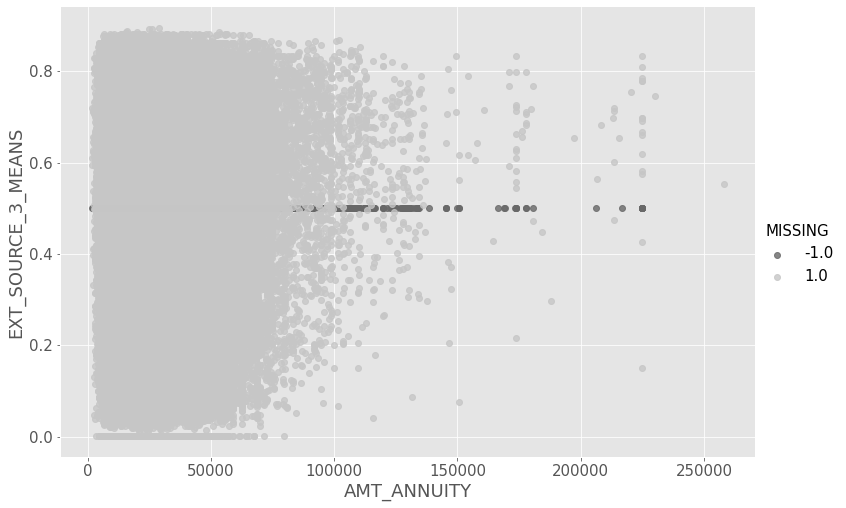

In [103]:
df_EXT_SOURCE_3_missing = pd.concat([df_missing_3, df_EXT_SOURCE_3, traintest], axis = 1)

ax = sns.lmplot(x='AMT_ANNUITY', y='EXT_SOURCE_3_MEANS',fit_reg = False,
                data=df_EXT_SOURCE_3_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

'EXT_SOURCE_3'と'AMT_ANNUITY（ローン年金）'はMARか？

In [104]:
############################## 
# COMMONAREA_MODE（共用部分の最頻値）の欠損値をプロットする
##############################

indexer_common = traintest['COMMONAREA_MODE'].isnull()
missing_common = traintest['COMMONAREA_MODE'].copy()
missing_common[indexer_common] = -1
missing_common[~indexer_common] = 1
df_missing_common = pd.DataFrame(missing_common)
df_missing_common.columns = ['MISSING'] # 欠損値とそうでない値のindex

In [105]:
df_COMMONAREA_MODE = traintest['COMMONAREA_MODE'].copy()
df_COMMONAREA_MODE[indexer_common] = 0.042553 # プロットのために平均値で欠損値を埋める
df_COMMONAREA_MODE = pd.DataFrame(df_COMMONAREA_MODE)
df_COMMONAREA_MODE.columns = ['COMMONAREA_MODE_MEANS']

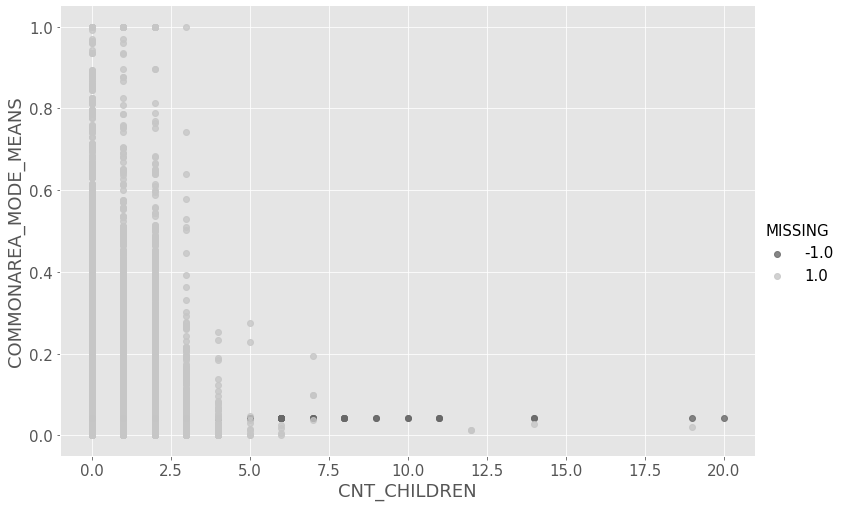

In [106]:
df_COMMONAREA_MODE_missing = pd.concat([df_missing_common, df_COMMONAREA_MODE, traintest], axis = 1)

ax = sns.lmplot(x='CNT_CHILDREN', y='COMMONAREA_MODE_MEANS',fit_reg = False,
                data=df_COMMONAREA_MODE_missing, hue='MISSING', 
                palette='Greys_r', size=7, aspect=1.5)

'COMMONAREA_MODE'と'CNT_CHILDREN（子供の数）'はややMNARかもしれない。

### Feature Importance in Gradient Boosting

In [107]:
############################## 
# train test split
############################## 

train_input=traintest[0:train.shape[0]-1].copy()
print("train_input shape is", train_input.shape)

test_input=traintest[train.shape[0]:].copy()
print("test_input shape is", test_input.shape)

train_input shape is (307510, 122)
test_input shape is (48744, 122)


In [108]:
y=train_input.TARGET
train_input.drop(['TARGET'], axis=1, inplace=True)
test_input.drop(['TARGET'], axis=1, inplace=True)

In [109]:
%%time 
# Wall time（実行時間）: 12.3 s

############################## 
# featureとTargetの相関 ----lightGBM----
##############################

lgbm_params = {'objective':'binary',
               'boosting_type': 'rf',
               'subsample': 0.623,
               'colsample_bytree': 0.7,
               'num_leaves': 127,
               'max_depth': 8,
               'seed': 99,
               'bagging_freq': 1,
               'n_jobs': 4}


train_features = [f for f in train_input if f not in ['SK_ID_CURR','TARGET']]

X_train, X_test, y_train, y_test = train_test_split(train_input[train_features],
                                                    y, random_state=42)
lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=False, silent=True)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)


model = lgb.train(lgbm_params, lgb_train, valid_sets=lgb_eval, num_boost_round=40)
importances_lgbm = pd.DataFrame()

importances_lgbm['importance_split'] = model.feature_importance(importance_type='split')
importances_lgbm['importance_gain'] = model.feature_importance(importance_type='gain')

feat_labels = train_input[train_features].columns[0:]

indices_s = np.argsort(importances_lgbm['importance_split'])[::-1]
indices_g = np.argsort(importances_lgbm['importance_gain'])[::-1]

for f in range(train_input[train_features].shape[1]):
    print('%2d) %-*s %f' %
          (f + 1, 30, feat_labels[indices_s[f]],
           importances_lgbm['importance_split'][indices_s[f]]))
    
for f in range(train_input[train_features].shape[1]):
    print('%2d) %-*s %f' %
          (f + 1, feat_labels[indices_g[f]],
           importances_lgbm['importance_gain'][indices_g[f]]))    

[LightGBM] [Info] Number of positive: 18642, number of negative: 211990
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.036361 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11284
[LightGBM] [Info] Number of data points in the train set: 230632, number of used features: 116
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080830 -> initscore=-2.431122
[LightGBM] [Info] Start training from score -2.431122
[1]	valid_0's binary_logloss: 0.281114
[2]	valid_0's binary_logloss: 0.272338
[3]	valid_0's binary_logloss: 0.26936
[4]	valid_0's binary_logloss: 0.264588
[5]	valid_0's binary_logloss: 0.264843
[6]	valid_0's binary_logloss: 0.264694
[7]	valid_0's binary_logloss: 0.260081
[8]	valid_0's binary_logloss: 0.260375
[9]	valid_0's binary_logloss: 0.259089
[10]	valid_0's binary_logloss: 0.257516
[11]	valid_0's binary_logloss: 0.25794
[12]	v

TypeError: * wants int

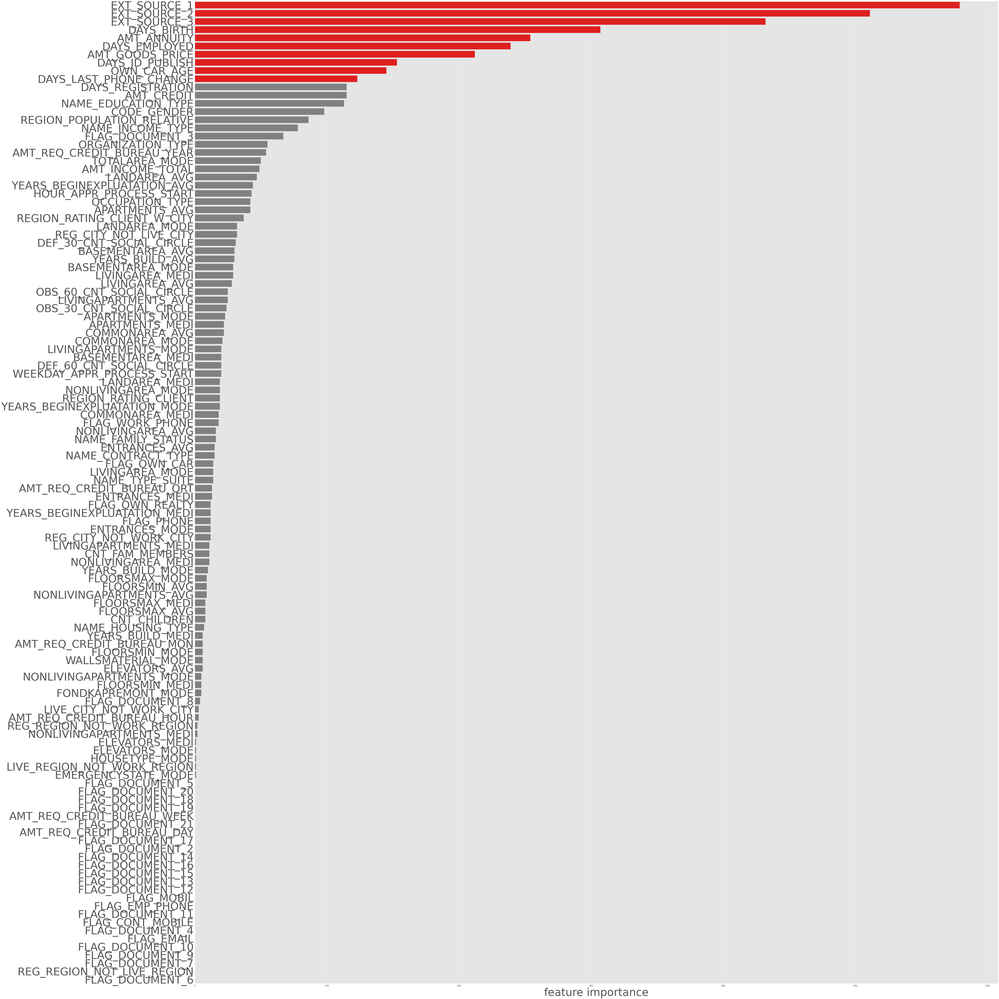

In [110]:
############################## 
# lgbm_feature_importance_split
# （分割情報量）プロット
############################## 

'''
（分割情報量）
111) NAME_EDUCATION_TYPE            149.000000
112) DAYS_LAST_PHONE_CHANGE         156.000000
113) AMT_GOODS_PRICE                166.000000
114) DAYS_ID_PUBLISH                174.000000
115) DAYS_EMPLOYED                  232.000000
116) AMT_ANNUITY                    235.000000
117) DAYS_BIRTH                     293.000000
118) EXT_SOURCE_3                   342.000000
119) EXT_SOURCE_2                   479.000000
120) EXT_SOURCE_1                   591.000000
'''

import heapq

ranking = np.argsort(-importances_lgbm['importance_split'])
f, ax = plt.subplots(figsize=(90, 90)) 

colors = ['red' if (x >= min(heapq.nlargest(10, importances_lgbm\
         ['importance_split'][ranking]))) else 'grey' \
          for x in importances_lgbm['importance_split'][ranking] ]

sns.barplot(x=importances_lgbm['importance_split'][ranking], 
            y=train_input[train_features].columns.values[ranking],
            orient='h',palette=colors)
ax.set_xlabel('feature importance',fontsize=70)
ax.set_yticklabels(feat_labels[indices_s],fontsize=70)
plt.tight_layout()
plt.show()

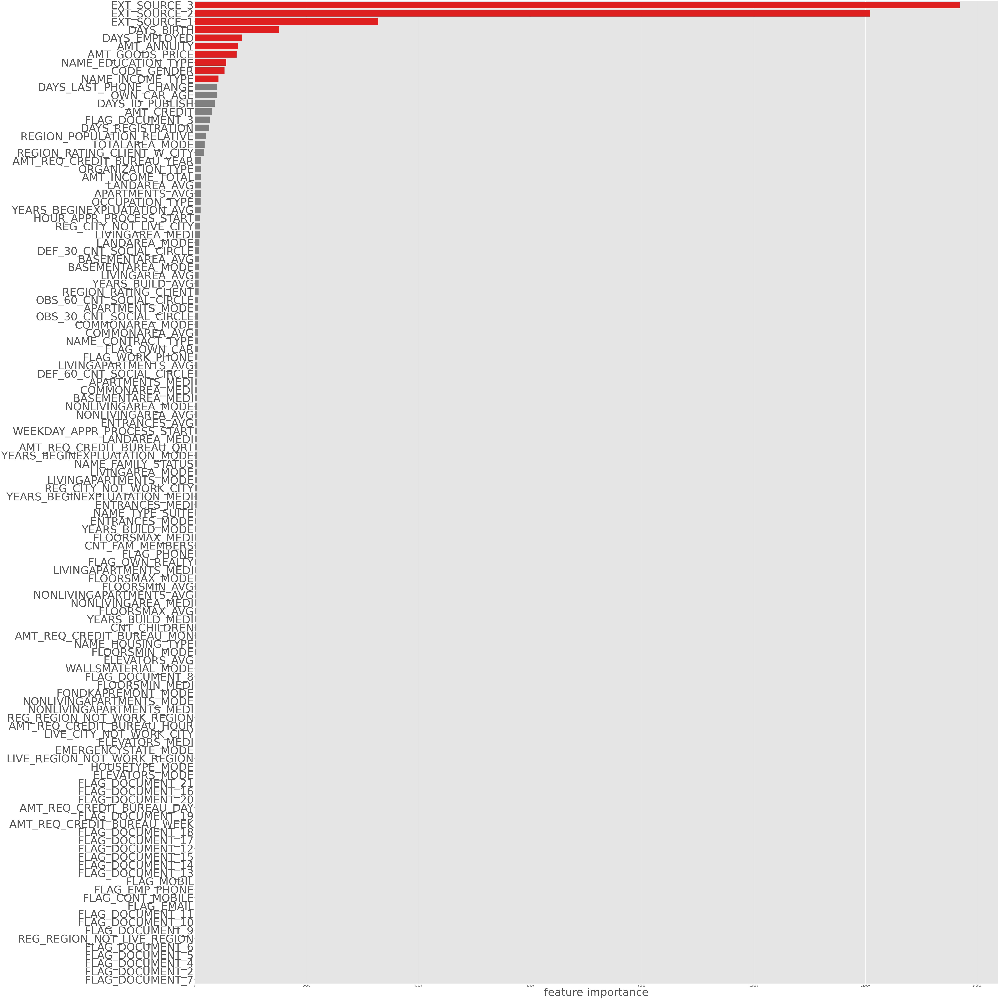

In [111]:
############################## 
# lgbm_feature_importance_gain
# （情報利得）プロット
##############################


'''
（情報利得）
111) DAYS_LAST_PHONE_CHANGE         1296.079843
112) AMT_GOODS_PRICE                1589.568607
113) CODE_GENDER                    1965.710663
114) AMT_ANNUITY                    2106.706560
115) NAME_EDUCATION_TYPE            2219.575218
116) DAYS_EMPLOYED                  2771.595773
117) DAYS_BIRTH                     4694.740393
118) EXT_SOURCE_1                   11008.756344
119) EXT_SOURCE_3                   33231.202842
120) EXT_SOURCE_2                   36166.178820
'''

ranking = np.argsort(-importances_lgbm['importance_gain'])
f, ax = plt.subplots(figsize=(90, 90)) 

colors = ['red' if (x >= min(heapq.nlargest(10, importances_lgbm['importance_gain'][ranking]))) else 'grey' 
          for x in importances_lgbm['importance_gain'][ranking] ]

sns.barplot(x=importances_lgbm['importance_gain'][ranking], 
            y=train_input[train_features].columns.values[ranking],
            orient='h',palette=colors)
ax.set_xlabel('feature importance',fontsize=70)
ax.set_yticklabels(feat_labels[indices_g],fontsize=70)
plt.tight_layout()
plt.show()

LightGBM Document                                                                                                   
https://lightgbm.readthedocs.io/en/latest/Python-API.html?highlight=importance#lightgbm.LGBMModel.booster_

Feature importance split / Feature importance gain

https://medium.com/the-artificial-impostor/feature-importance-measures-for-tree-models-part-i-47f187c1a2c3

### Feature Engineering -- Null Total 

In [112]:
train_input=traintest[0:train.shape[0]-1].copy()

null_total = train_input.isnull().sum(axis=1)
train_input_plus = train_input.copy()
train_input_plus = pd.concat([train_input_plus, null_total], axis=1)
train_input_plus = train_input_plus.rename(columns={0: 'NULL_TOTAL'})
grouped_target = train_input_plus[['TARGET','NULL_TOTAL']].groupby('TARGET')
grouped_target.describe()['NULL_TOTAL']
#train_input_plus[['TARGET','NULL_TOTAL']].sort_values('NULL_TOTAL', ascending=False)

,count,mean,std,min,25%,50%,75%,max
TARGET,,,,,,,,
0.0,282685.0,27.027310,19.152265,0.0,4.0,32.0,44.0,56.0
1.0,24825.0,30.125398,18.862443,0.0,9.0,43.0,45.0,55.0


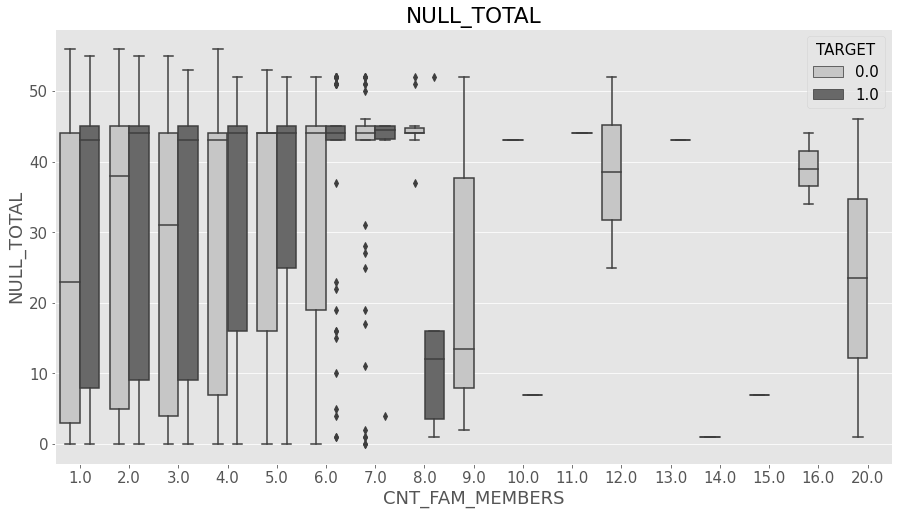

In [113]:
plt.figure(figsize=(15, 8))

ax = sns.boxplot(x='CNT_FAM_MEMBERS',y='NULL_TOTAL',hue='TARGET',
                 data=train_input_plus, palette='Greys')
plt.title('NULL_TOTAL')
plt.show()

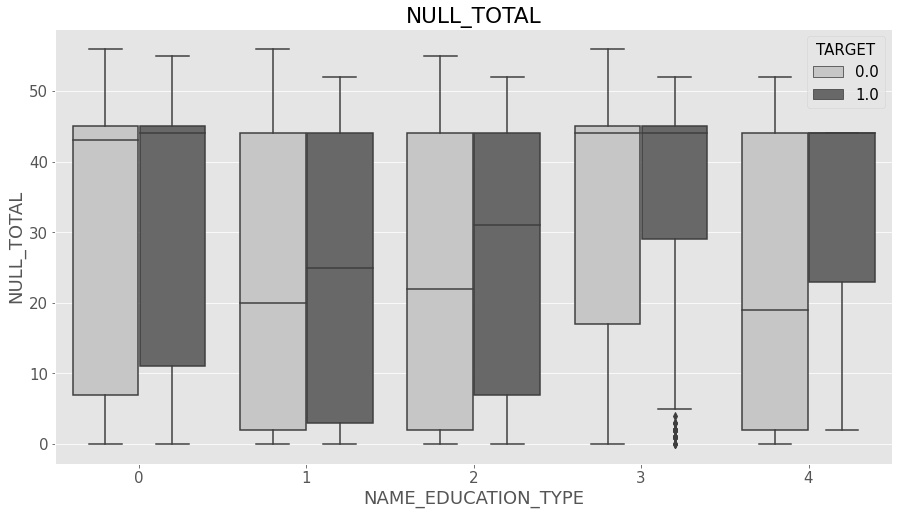

In [114]:

plt.figure(figsize=(15, 8))

ax = sns.boxplot(x='NAME_EDUCATION_TYPE',y='NULL_TOTAL',hue='TARGET',
                 data=train_input_plus, palette='Greys')
plt.title('NULL_TOTAL')
plt.show()

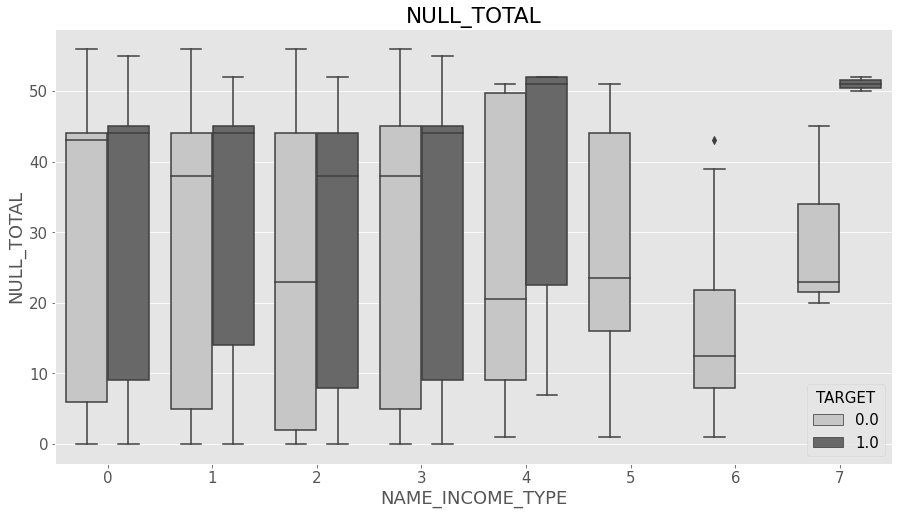

In [115]:
plt.figure(figsize=(15, 8))

ax = sns.boxplot(x='NAME_INCOME_TYPE',y='NULL_TOTAL',hue='TARGET',
                 data=train_input_plus, palette='Greys')
plt.title('NULL_TOTAL')
plt.show()

NULL_TOTALとDefaulterの相関は高そう

### Re: Feature Importance in Gradient Boosting
NULL_TOTALの重要度をチェック

In [116]:
y=train_input_plus.TARGET
train_input_plus.drop(['TARGET'], axis=1, inplace=True)

In [117]:
%%time 
# Wall time（実行時間）: 11.1 s

############################## 
# featureとTargetの相関 ----lightGBM----
##############################

lgbm_params = {'objective':'binary',
               'boosting_type': 'rf',
               'subsample': 0.623,
               'colsample_bytree': 0.7,
               'num_leaves': 127,
               'max_depth': 8,
               'seed': 99,
               'bagging_freq': 1,
               'n_jobs': 4}


train_features = [f for f in train_input_plus if f not in ['SK_ID_CURR','TARGET']]

X_train, X_test, y_train, y_test = train_test_split(train_input_plus[train_features],
                                                    y, random_state=42)
lgb_train = lgb.Dataset(X_train, y_train, free_raw_data=False, silent=True)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)


model = lgb.train(lgbm_params, lgb_train, valid_sets=lgb_eval, num_boost_round=40)
importances_lgbm = pd.DataFrame()

importances_lgbm['importance_split'] = model.feature_importance(importance_type='split')
importances_lgbm['importance_gain'] = model.feature_importance(importance_type='gain')

feat_labels = train_input_plus[train_features].columns[0:]

indices_s = np.argsort(importances_lgbm['importance_split'])[::-1]
indices_g = np.argsort(importances_lgbm['importance_gain'])[::-1]

for f in range(train_input_plus[train_features].shape[1]):
    print('%2d) %-*s %f' %
          (f + 1, 30, feat_labels[indices_s[f]],
           importances_lgbm['importance_split'][indices_s[f]]))
    
for f in range(train_input_plus[train_features].shape[1]):
    print('%2d) %-*s %f' %
          (f + 1, 30, feat_labels[indices_g[f]],
           importances_lgbm['importance_gain'][indices_g[f]]))    

[LightGBM] [Info] Number of positive: 18642, number of negative: 211990
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.033953 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 11340
[LightGBM] [Info] Number of data points in the train set: 230632, number of used features: 117
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080830 -> initscore=-2.431122
[LightGBM] [Info] Start training from score -2.431122
[1]	valid_0's binary_logloss: 0.28179
[2]	valid_0's binary_logloss: 0.268307
[3]	valid_0's binary_logloss: 0.265952
[4]	valid_0's binary_logloss: 0.264195
[5]	valid_0's binary_logloss: 0.263648
[6]	valid_0's binary_logloss: 0.262763
[7]	valid_0's binary_logloss: 0.259976
[8]	valid_0's binary_logloss: 0.258252
[9]	valid_0's binary_logloss: 0.258284
[10]	valid_0's binary_logloss: 0.258008
[11]	valid_0's binary_logloss: 0.257272
[12]	

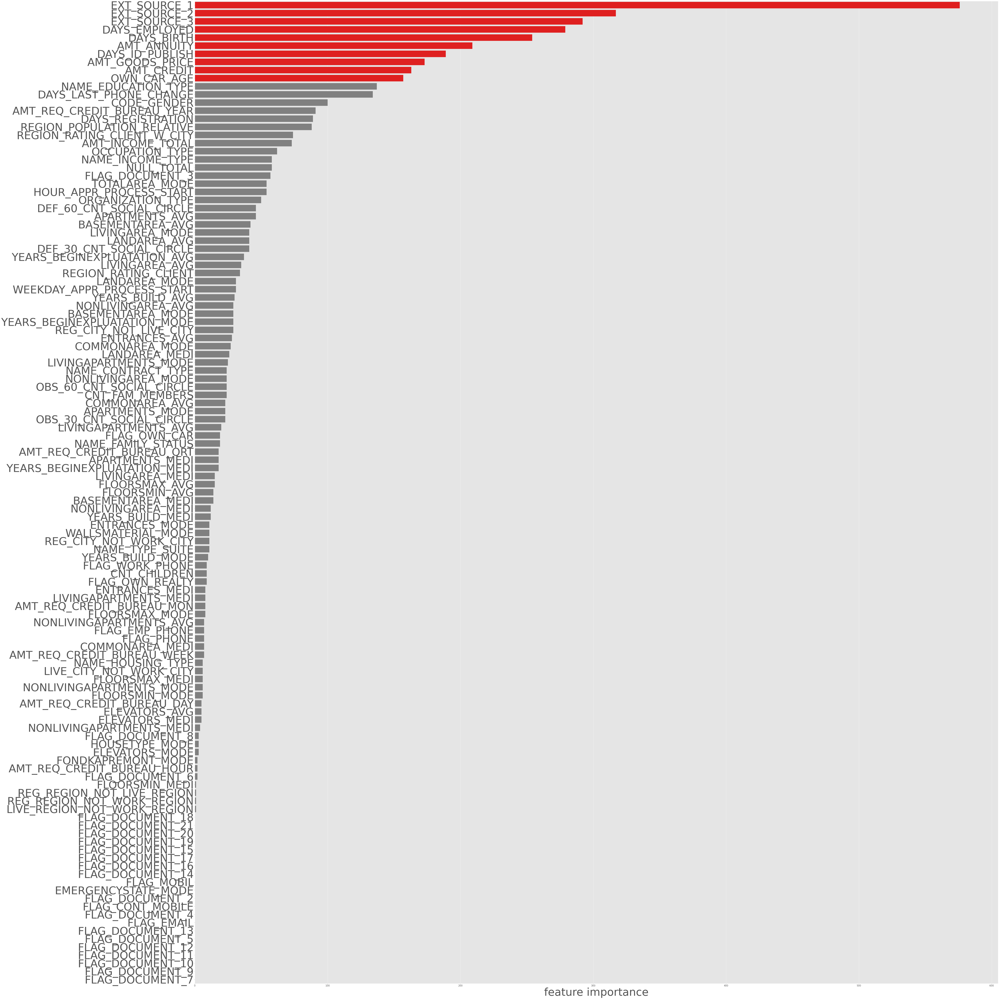

In [118]:
############################## 
# lgbm_feature_importance_split
# （分割情報量）プロット
############################## 

'''
（分割情報量）
105) NULL_TOTAL                     76.000000
:
111) DAYS_REGISTRATION              130.000000
112) AMT_CREDIT                     130.000000
113) DAYS_LAST_PHONE_CHANGE         175.000000
114) AMT_GOODS_PRICE                188.000000
115) DAYS_ID_PUBLISH                204.000000
116) DAYS_EMPLOYED                  222.000000
117) AMT_ANNUITY                    264.000000
118) DAYS_BIRTH                     313.000000
119) EXT_SOURCE_3                   357.000000
120) EXT_SOURCE_2                   385.000000
121) EXT_SOURCE_1                   541.000000
'''

import heapq

ranking = np.argsort(-importances_lgbm['importance_split'])
f, ax = plt.subplots(figsize=(90, 90)) 

colors = ['red' if (x >= min(heapq.nlargest(10, importances_lgbm['importance_split'][ranking]))) else 'grey' 
          for x in importances_lgbm['importance_split'][ranking] ]

sns.barplot(x=importances_lgbm['importance_split'][ranking], 
            y=train_input_plus[train_features].columns.values[ranking],
            orient='h',palette=colors)
ax.set_xlabel("feature importance",fontsize=70)
ax.set_yticklabels(feat_labels[indices_s],fontsize=70)
plt.tight_layout()
plt.show()

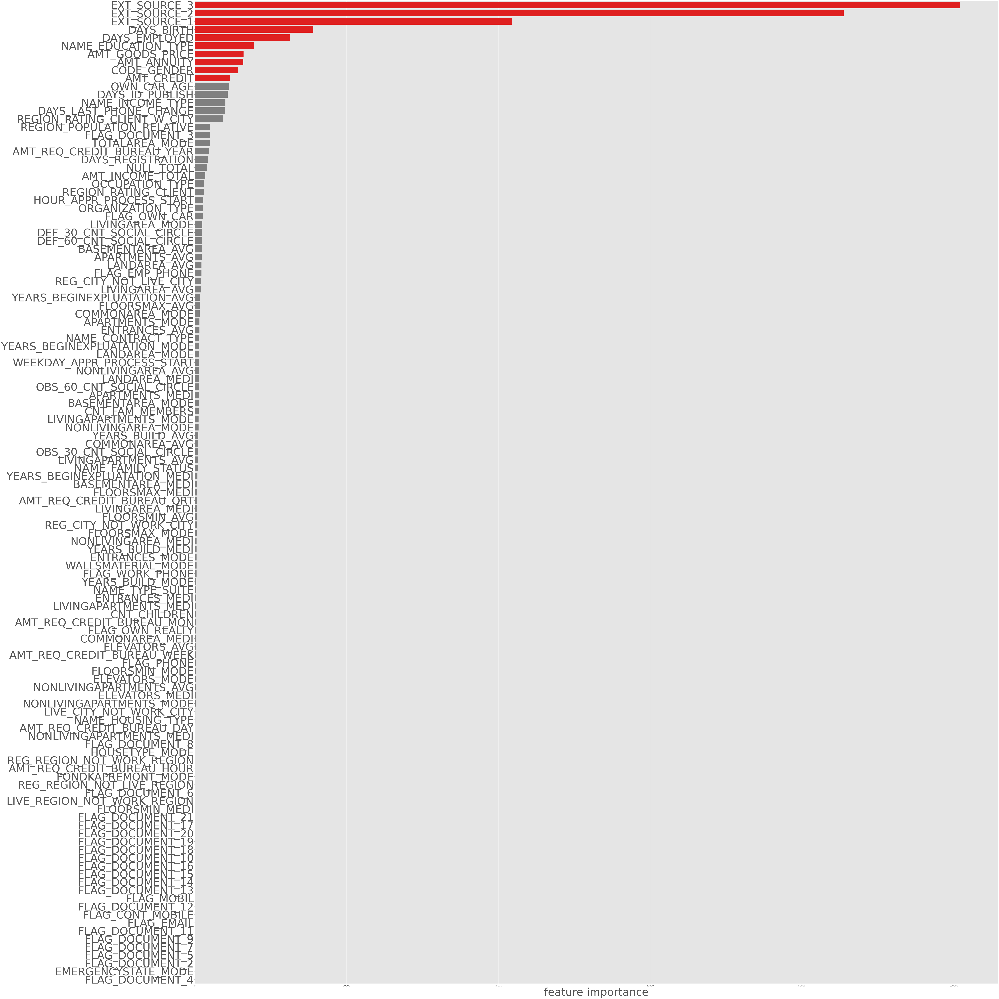

In [119]:
############################## 
# lgbm_feature_importance_gain
# （情報利得）プロット
##############################


'''
（情報利得）
105) NULL_TOTAL                     640.311199
:
111) DAYS_ID_PUBLISH                1418.289593
112) DAYS_LAST_PHONE_CHANGE         1463.842113
113) CODE_GENDER                    1764.745049
114) AMT_GOODS_PRICE                2069.242513
115) NAME_EDUCATION_TYPE            2112.632088
116) AMT_ANNUITY                    2457.607379
117) DAYS_EMPLOYED                  2524.574238
118) DAYS_BIRTH                     4724.893482
119) EXT_SOURCE_1                   11515.343445
120) EXT_SOURCE_2                   27955.713406
121) EXT_SOURCE_3                   37050.241625
'''

ranking = np.argsort(-importances_lgbm['importance_gain'])
f, ax = plt.subplots(figsize=(90, 90)) 

colors = ['red' if (x >= min(heapq.nlargest(10, importances_lgbm['importance_gain'][ranking]))) else 'grey' 
          for x in importances_lgbm['importance_gain'][ranking] ]

sns.barplot(x=importances_lgbm['importance_gain'][ranking], 
            y=train_input_plus[train_features].columns.values[ranking],
            orient='h',palette=colors)
ax.set_xlabel("feature importance",fontsize=70)
ax.set_yticklabels(feat_labels[indices_g],fontsize=70)
plt.tight_layout()
plt.show()

NULL_TOTALは重要度のTOP16に入る

In [120]:
from sklearn.datasets import load_iris
from sklearn.linear_model import LogisticRegression
X, y = load_iris(return_X_y=True)
clf = LogisticRegression(random_state=0, solver='lbfgs',
...                          multi_class='multinomial').fit(X, y)
clf.predict(X[:2, :])
array([0, 0])
clf.predict_proba(X[:2, :]) 
array([[9.8...e-01, 1.8...e-02, 1.4...e-08],
       [9.7...e-01, 2.8...e-02, ...e-08]])
clf.score(X, y)

SyntaxError: invalid syntax (<ipython-input-120-56fb55c13de7>, line 5)

In [ ]:
from tqdm import tqdm
import time
 
for _ in tqdm(range(100)):
    time.sleep(0.1)